## 1. Basic Image Operations

### Loading and Displaying Images

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

In [10]:
# Load an image
img = cv2.imread('Parrot.jpg')  # BGR format
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB

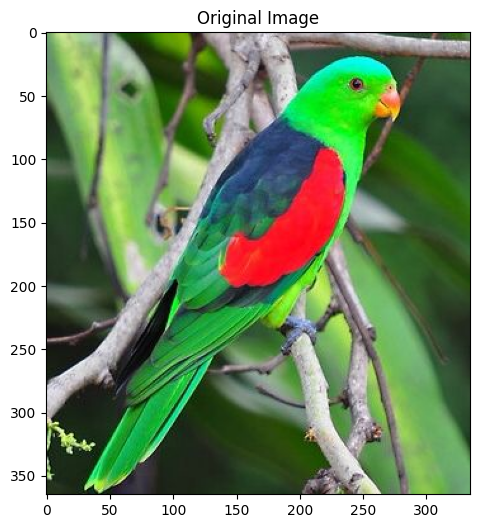

In [11]:
# Display image using matplotlib
plt.figure(figsize=(10, 6))
plt.imshow(img_rgb)
# plt.axis('off')
plt.title('Original Image')
plt.show()

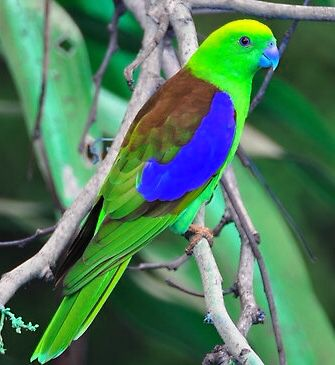

In [12]:
cv2_imshow(img_rgb)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

### Basic Image Information

In [13]:
# Get image dimensions and properties
print(f"Image shape: {img.shape}")  # (height, width, channels)
print(f"Image size: {img.size}")    # total pixels
print(f"Data type: {img.dtype}")    # usually uint8

Image shape: (365, 335, 3)
Image size: 366825
Data type: uint8


In [14]:
# Access pixel values
pixel_value = img[150, 200]  # (y, x) - BGR values
print(f"Pixel value at (100,50): {pixel_value}")

Pixel value at (100,50): [ 47  21 255]


In [15]:
# Modify pixel values
img[150, 200] = [255, 255, 255]  # Set to white

### Saving Images

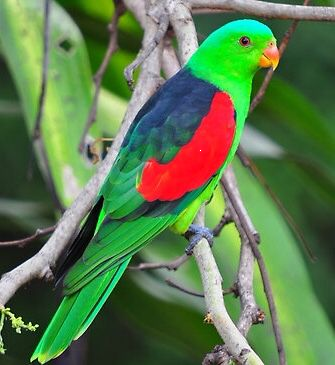

In [16]:
# Save image
cv2.imwrite('output.jpg', img)
cv2_imshow(img)

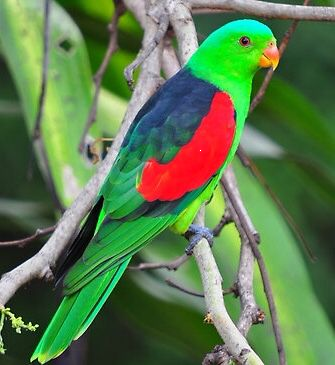

In [17]:
# Save with different quality (for JPEG)
cv2.imwrite('output_high_quality.jpg', img, [cv2.IMWRITE_JPEG_QUALITY, 105])
cv2_imshow(img)

## 2. Image Transformations

### Resizing

In [18]:
# Resize image
height, width = img.shape[:2]

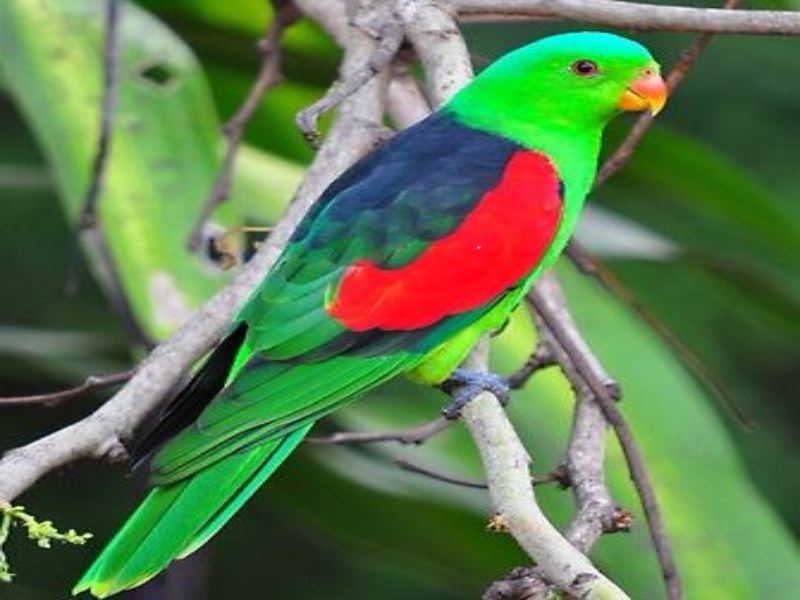

In [19]:
# Method 1: Specify exact dimensions
resized = cv2.resize(img, (800, 600))
cv2_imshow(resized)

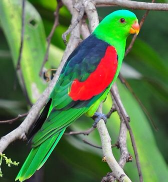

In [20]:
# Method 2: Scale by factor
scaled = cv2.resize(img, None, fx=0.5, fy=0.5)
cv2_imshow(scaled)

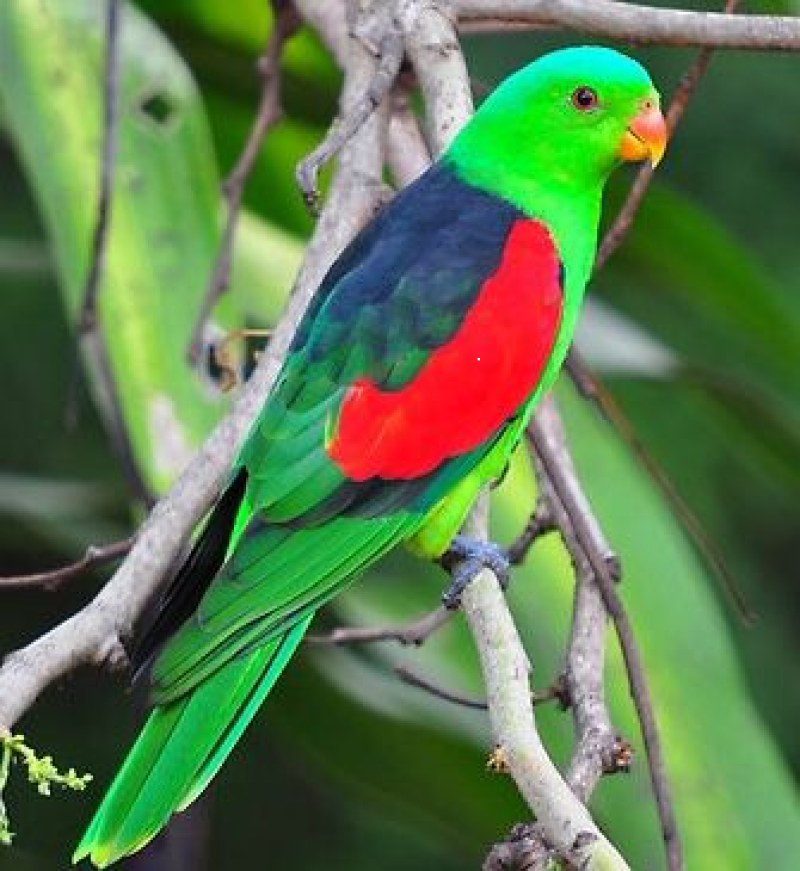

In [21]:
# Method 3: Maintain aspect ratio
def resize_with_aspect_ratio(image, width=None, height=None, inter=cv2.INTER_AREA):
    dim = None
    (h, w) = image.shape[:2]

    if width is None and height is None:
        return image

    if width is None:
        r = height / float(h)
        dim = (int(w * r), height)
    else:
        r = width / float(w)
        dim = (width, int(h * r))

    return cv2.resize(image, dim, interpolation=inter)

new_img = resize_with_aspect_ratio(img, width=800, height=600, inter=cv2.INTER_AREA)
cv2_imshow(new_img)

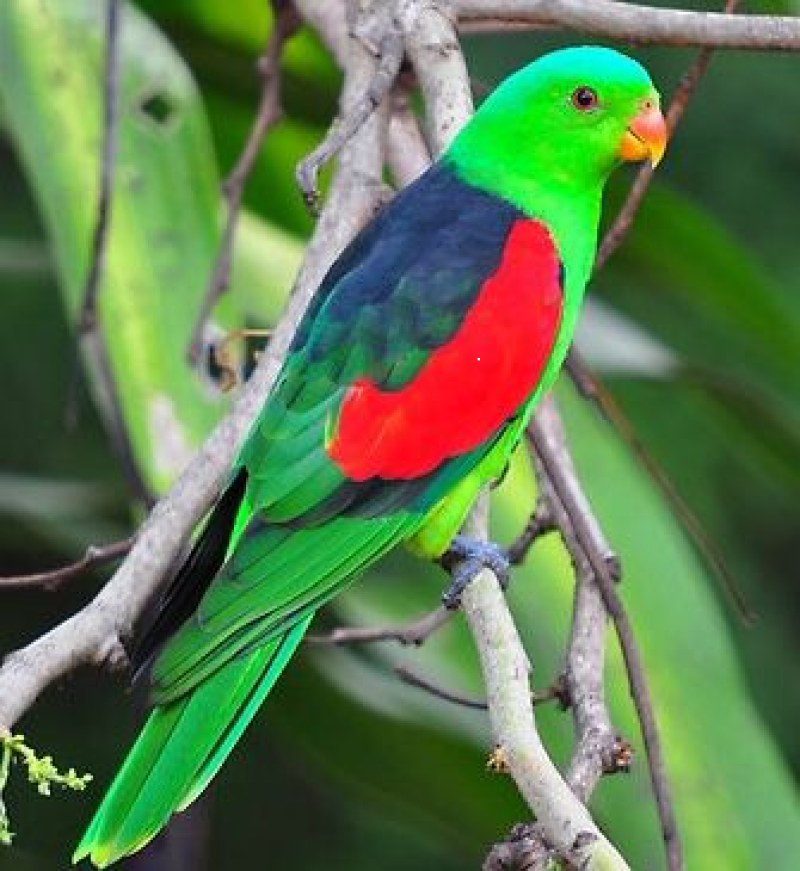

In [22]:
resized_aspect = resize_with_aspect_ratio(img, width=800)
cv2_imshow(resized_aspect)

### Rotation

In [23]:
# Get image center
center = (width // 2, height // 2)

In [24]:
# Rotation matrix
angle = 45  # degrees
scale = 1.0
rotation_matrix = cv2.getRotationMatrix2D(center, angle, scale)

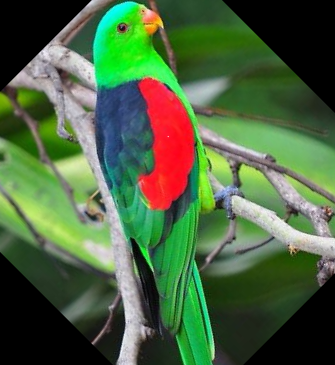

In [25]:
# Apply rotation
rotated = cv2.warpAffine(img, rotation_matrix, (width, height))
cv2_imshow(rotated)

In [26]:
# Rotate without cropping
cos = np.abs(rotation_matrix[0, 0])
sin = np.abs(rotation_matrix[0, 1])
new_width = int((height * sin) + (width * cos))
new_height = int((height * cos) + (width * sin))

In [27]:
rotation_matrix[0, 2] += (new_width / 2) - center[0]
rotation_matrix[1, 2] += (new_height / 2) - center[1]

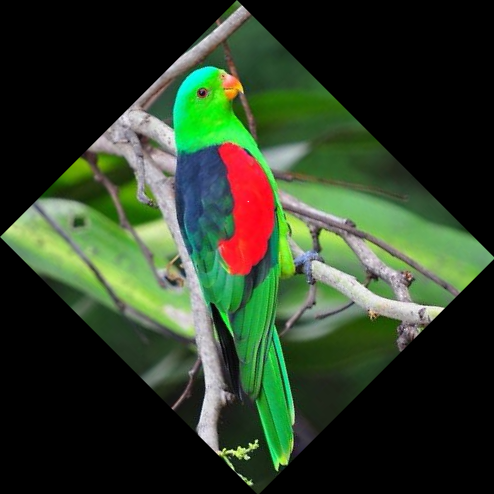

In [28]:
rotated_full = cv2.warpAffine(img, rotation_matrix, (new_width, new_height))
cv2_imshow(rotated_full)

### Cropping

In [29]:
# Simple cropping
x, y, w, h = 100, 50, 400, 300  # x, y, width, height
cropped = img[y:y+h, x:x+w]

In [30]:
# Crop from center
def crop_center(img, crop_width, crop_height):
    h, w = img.shape[:2]
    start_x = w // 2 - crop_width // 2
    start_y = h // 2 - crop_height // 2
    return img[start_y:start_y+crop_height, start_x:start_x+crop_width]

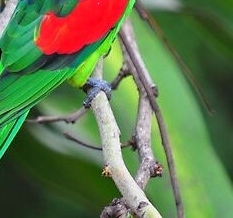

In [31]:
center_cropped = crop_center(img, 800, 800)
cv2_imshow(center_cropped)

### Flipping

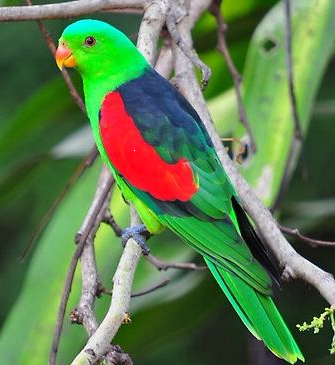

In [32]:
# Horizontal flip
horizontal_flip = cv2.flip(img, 1)
cv2_imshow(horizontal_flip)

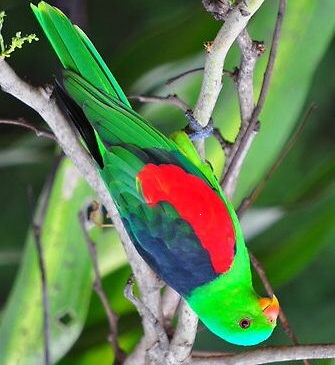

In [33]:
# Vertical flip
vertical_flip = cv2.flip(img, 0)
cv2_imshow(vertical_flip)

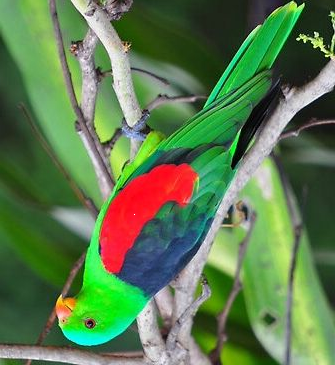

In [34]:
# Both horizontal and vertical
both_flip = cv2.flip(img, -1)
cv2_imshow(both_flip)

## 3. Filtering and Noise Reduction

### Gaussian Blur

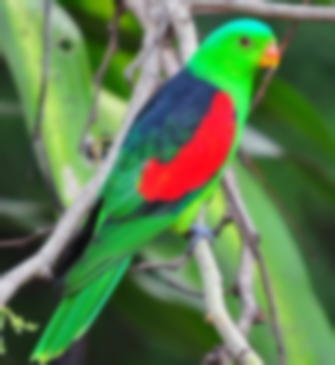

In [35]:
# Gaussian blur for noise reduction
gaussian_blur = cv2.GaussianBlur(img, (15, 15), 0)
cv2_imshow(gaussian_blur)

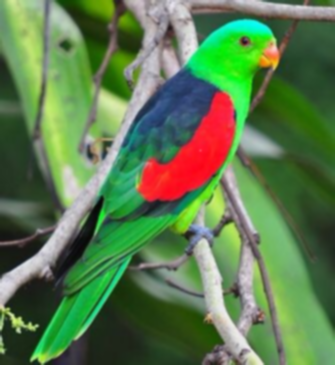

In [36]:
# Different kernel sizes
blur_light = cv2.GaussianBlur(img, (5, 5), 0)
cv2_imshow(blur_light)

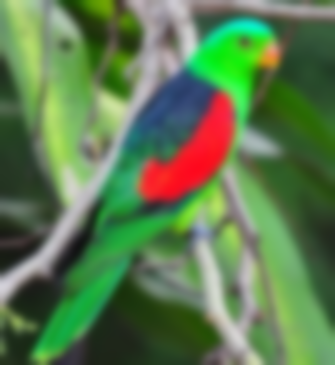

In [37]:
blur_heavy = cv2.GaussianBlur(img, (25, 25), 0)
cv2_imshow(blur_heavy)

### Other Blur Techniques

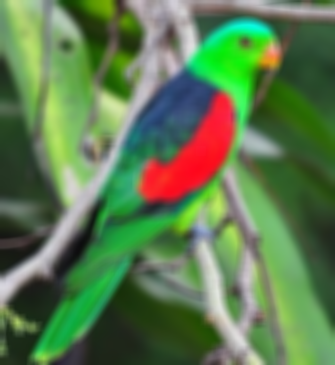

In [38]:
# Average blur
avg_blur = cv2.blur(img, (10, 10))
cv2_imshow(avg_blur)

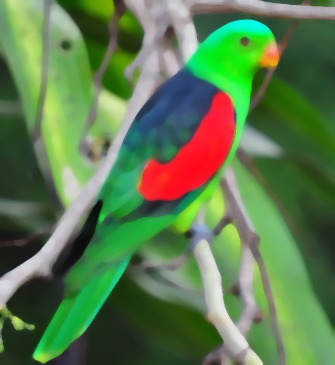

In [39]:
# Median blur (good for salt-and-pepper noise)
median_blur = cv2.medianBlur(img, 9)
cv2_imshow(median_blur)

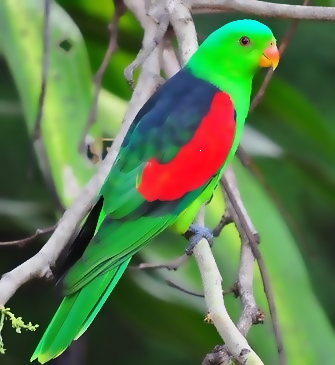

In [40]:
# Bilateral filter (preserves edges)
bilateral = cv2.bilateralFilter(img, 9, 75, 75)
cv2_imshow(bilateral)

### Sharpening

In [41]:
# Create sharpening kernel
kernel_sharpen = np.array([[-1, -1, -1],
                          [-1,  9, -1],
                          [-1, -1, -1]])

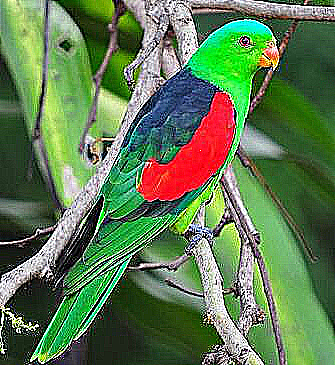

In [42]:
sharpened = cv2.filter2D(img, -1, kernel_sharpen)
cv2_imshow(sharpened)

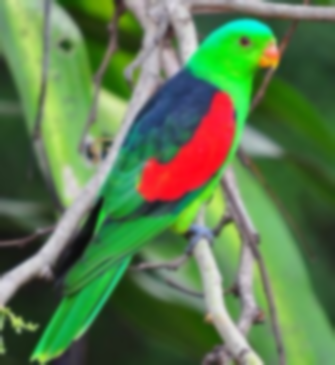

In [43]:
# Unsharp masking
gaussian = cv2.GaussianBlur(img, (0, 0), 2.0)
cv2_imshow(gaussian)

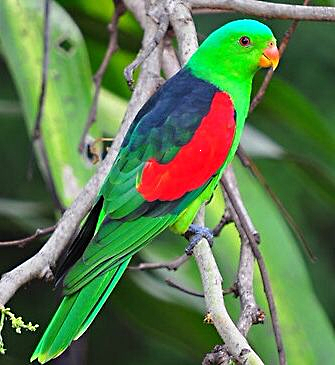

In [44]:
unsharp_mask = cv2.addWeighted(img, 1.5, gaussian, -0.5, 0)
cv2_imshow(unsharp_mask)

## 4. Edge Detection

### Canny Edge Detection

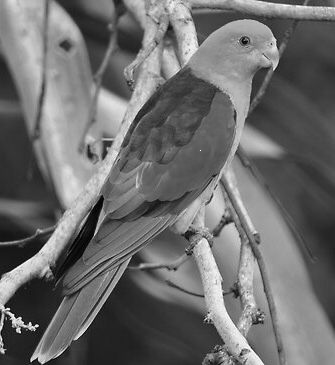

In [45]:
# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(gray)

In [46]:
# Canny edge detection
edges = cv2.Canny(gray, 50, 150)

In [47]:
# Adaptive thresholds
edges_auto = cv2.Canny(gray, 50, 150, apertureSize=3, L2gradient=True)

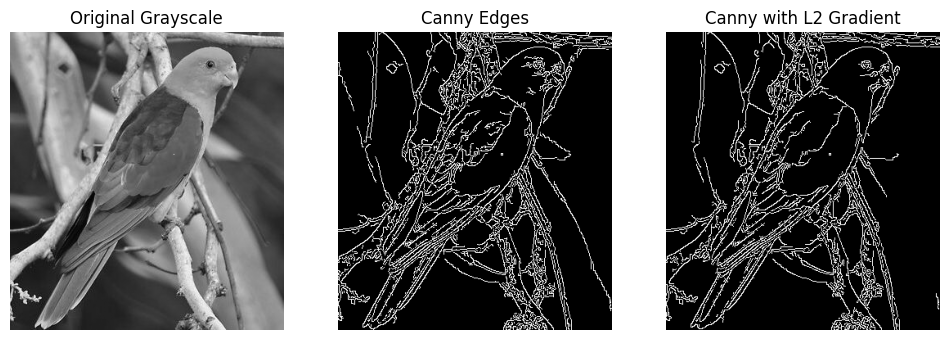

In [48]:
# Display edges
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.imshow(gray, cmap='gray')
plt.title('Original Grayscale')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(edges, cmap='gray')
plt.title('Canny Edges')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(edges_auto, cmap='gray')
plt.title('Canny with L2 Gradient')
plt.axis('off')
plt.show()

### Sobel Edge Detection

In [49]:
# Sobel edge detection
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)  # X direction
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)  # Y direction

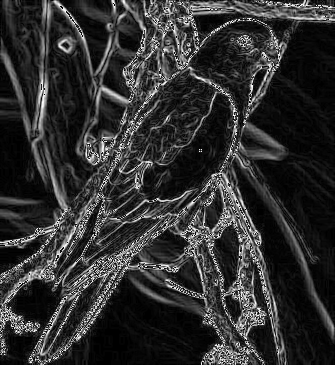

In [50]:
# Combine both directions
sobel_combined = np.sqrt(sobelx**2 + sobely**2)
sobel_combined = np.uint8(sobel_combined)
cv2_imshow(sobel_combined)

### Laplacian Edge Detection

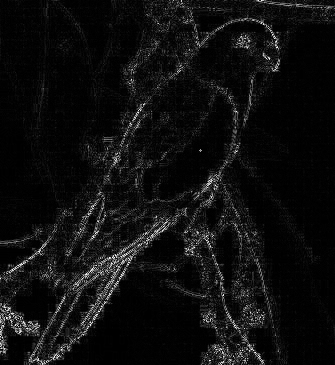

In [51]:
# Laplacian edge detection
laplacian = cv2.Laplacian(gray, cv2.CV_64F)
laplacian = np.uint8(np.absolute(laplacian))
cv2_imshow(laplacian)

## 5. Morphological Operations

In [52]:
# Define kernel
kernel = np.ones((5, 5), np.uint8)
kernel

array([[1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1]], dtype=uint8)

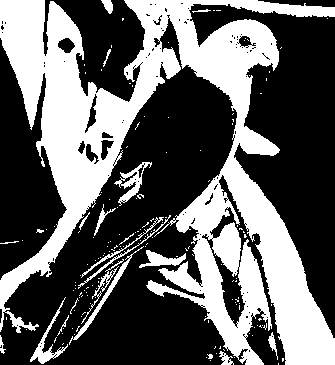

In [53]:
# Convert to binary image first
_, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
cv2_imshow(binary)

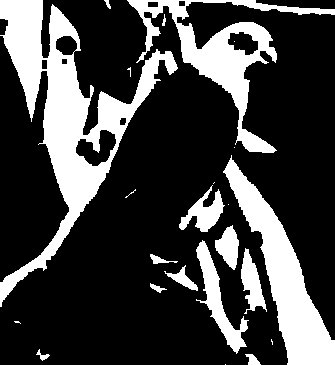

In [54]:
# Erosion (shrinks white regions)
erosion = cv2.erode(binary, kernel, iterations=1)
cv2_imshow(erosion)

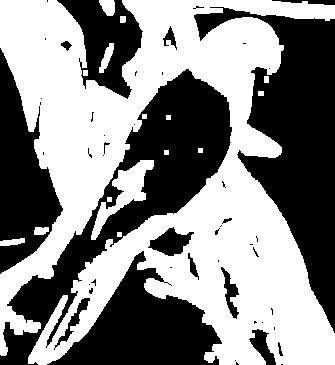

In [55]:
# Dilation (expands white regions)
dilation = cv2.dilate(binary, kernel, iterations=1)
cv2_imshow(dilation)

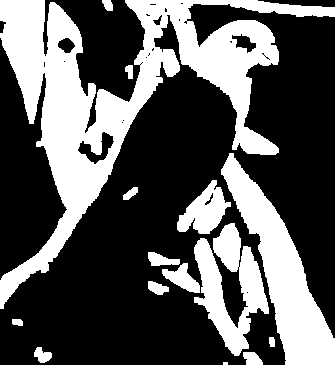

In [56]:
# Opening (erosion followed by dilation)
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
cv2_imshow(opening)

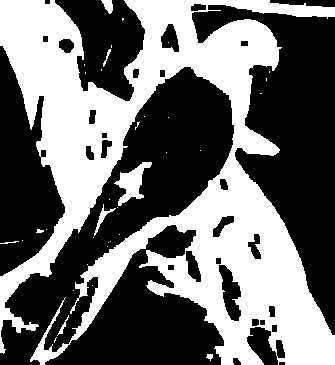

In [57]:
# Closing (dilation followed by erosion)
closing = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)
cv2_imshow(closing)

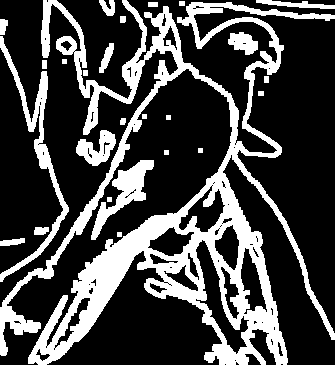

In [58]:
# Gradient (difference between dilation and erosion)
gradient = cv2.morphologyEx(binary, cv2.MORPH_GRADIENT, kernel)
cv2_imshow(gradient)

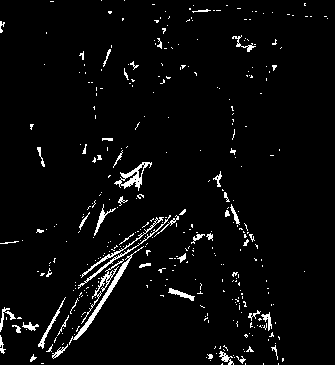

In [59]:
# Top hat (difference between input and opening)
tophat = cv2.morphologyEx(binary, cv2.MORPH_TOPHAT, kernel)
cv2_imshow(tophat)

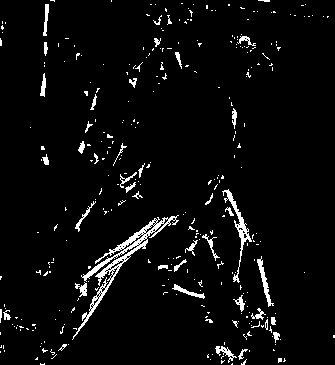

In [60]:
# Black hat (difference between closing and input)
blackhat = cv2.morphologyEx(binary, cv2.MORPH_BLACKHAT, kernel)
cv2_imshow(blackhat)

## 6. Color Space Conversions

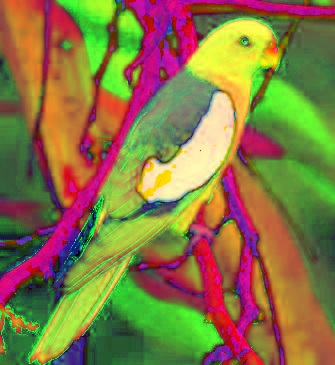

In [61]:
# BGR to other color spaces
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
cv2_imshow(hsv)

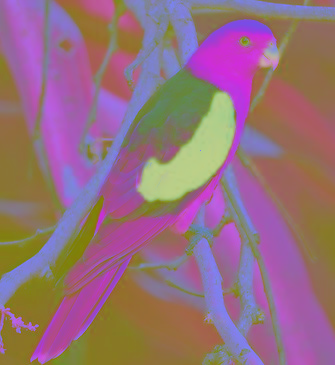

In [62]:
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
cv2_imshow(lab)

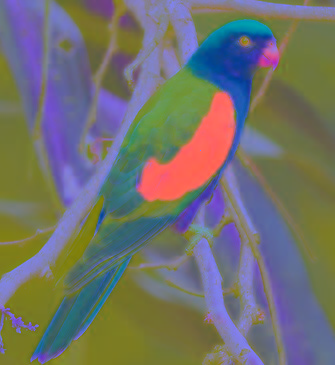

In [63]:
yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
cv2_imshow(yuv)

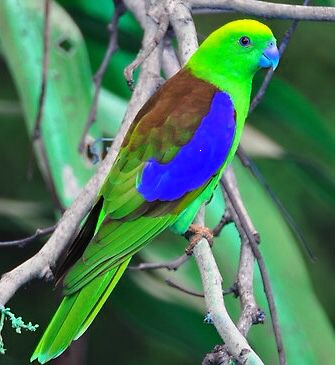

In [64]:
rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
cv2_imshow(rgb)

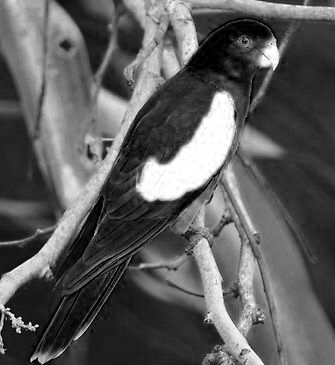

In [65]:
# Split channels
b, g, r = cv2.split(img)
cv2_imshow(r)

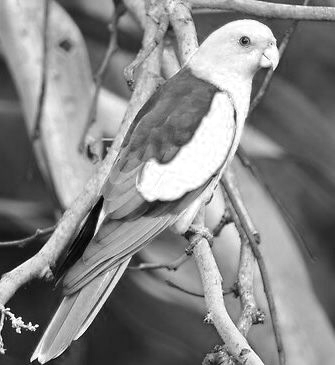

In [66]:
h, s, v = cv2.split(hsv)
cv2_imshow(v)

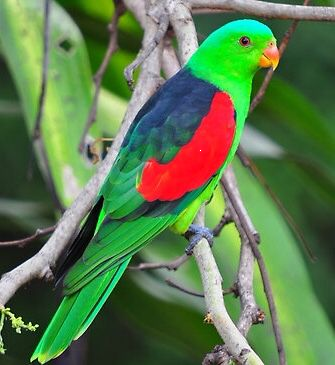

In [67]:
# Merge channels
merged = cv2.merge([b, g, r])
cv2_imshow(merged)

In [68]:
# Color masking example (detect blue objects)
lower_blue = np.array([100, 50, 50])
upper_blue = np.array([130, 255, 255])

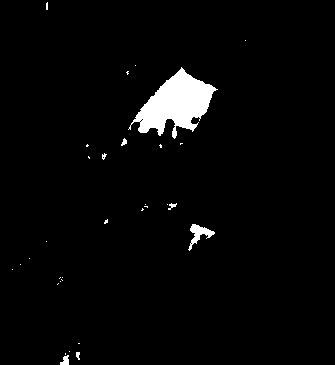

In [69]:
mask = cv2.inRange(hsv, lower_blue, upper_blue)
cv2_imshow(mask)

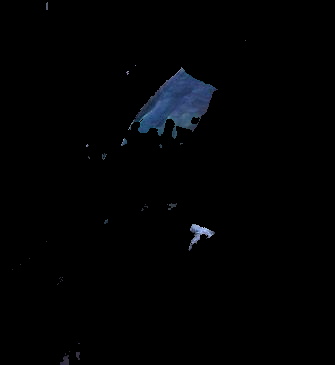

In [70]:
blue_objects = cv2.bitwise_and(img, img, mask=mask)
cv2_imshow(blue_objects)

## 7. Thresholding

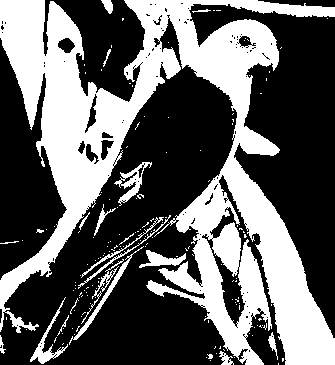

In [71]:
# Simple thresholding
_, thresh_binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
cv2_imshow(thresh_binary)

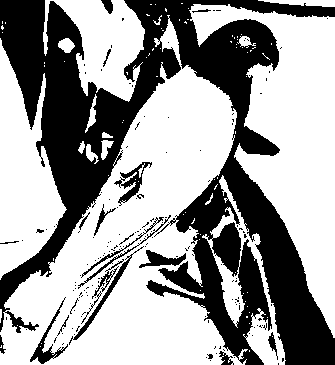

In [72]:
_, thresh_binary_inv = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV)
cv2_imshow(thresh_binary_inv)

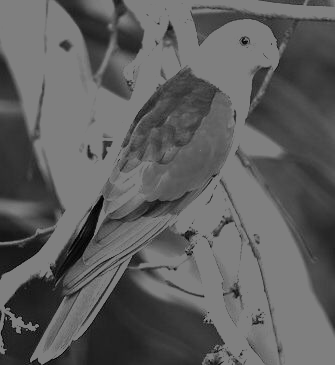

In [73]:
_, thresh_trunc = cv2.threshold(gray, 127, 255, cv2.THRESH_TRUNC)
cv2_imshow(thresh_trunc)

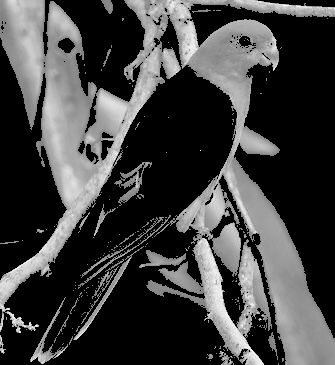

In [74]:
_, thresh_tozero = cv2.threshold(gray, 127, 255, cv2.THRESH_TOZERO)
cv2_imshow(thresh_tozero)

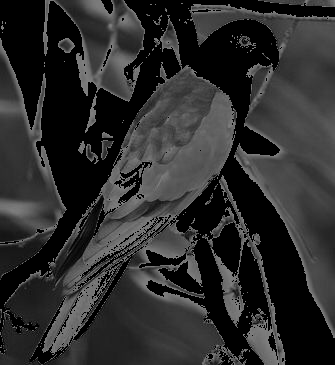

In [75]:
_, thresh_tozero_inv = cv2.threshold(gray, 127, 255, cv2.THRESH_TOZERO_INV)
cv2_imshow(thresh_tozero_inv)

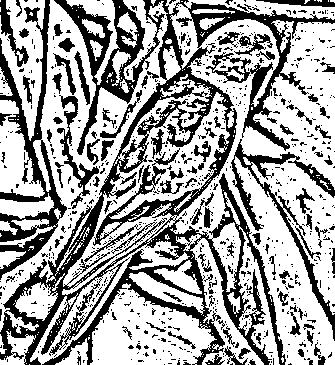

In [76]:
# Adaptive thresholding
adaptive_mean = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                     cv2.THRESH_BINARY, 11, 2)
cv2_imshow(adaptive_mean)

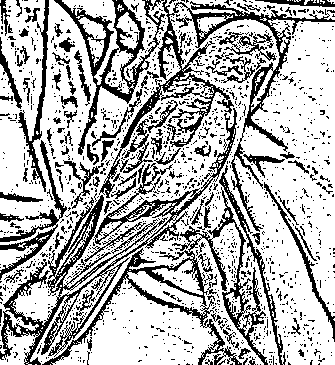

In [77]:
adaptive_gaussian = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
cv2_imshow(adaptive_gaussian)

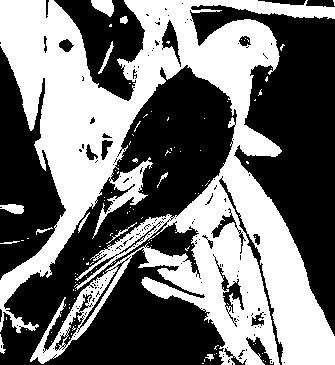

In [78]:
# Otsu's thresholding
_, otsu_thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
cv2_imshow(otsu_thresh)

## 8. Contour Detection

In [79]:
# Find contours
contours, hierarchy = cv2.findContours(thresh_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

array([[[  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0],
        ...,
        [ 69, 131,  83],
        [ 78, 138,  90],
        [ 90, 145,  98]],

       [[  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0],
        ...,
        [ 69, 131,  85],
        [ 79, 136,  91],
        [ 88, 143,  98]],

       [[  0, 255,   0],
        [  0, 255,   0],
        [108, 167, 117],
        ...,
        [ 65, 124,  80],
        [ 73, 129,  86],
        [ 83, 137,  94]],

       ...,

       [[ 26,  49,  35],
        [ 26,  49,  35],
        [ 27,  50,  36],
        ...,
        [117, 171, 111],
        [  0, 255,   0],
        [  0, 255,   0]],

       [[ 26,  49,  35],
        [ 26,  49,  35],
        [ 27,  50,  36],
        ...,
        [  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0]],

       [[ 28,  48,  36],
        [ 28,  48,  36],
        [ 26,  48,  36],
        ...,
        [  0, 255,   0],
        [  0, 255,   0],
        [  0, 255,   0]]], dtype=uint8)
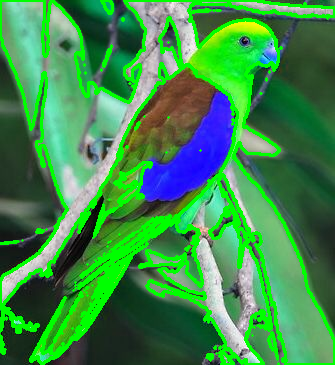

In [80]:
# Draw all contours
img_contours = img.copy()
cv2.drawContours(img_contours, contours, -1, (0, 255, 0), 2)

In [81]:
# Analyze contours
for i, contour in enumerate(contours):
    # Area
    area = cv2.contourArea(contour)

    # Perimeter
    perimeter = cv2.arcLength(contour, True)

    # Bounding rectangle
    x, y, w, h = cv2.boundingRect(contour)
    cv2.rectangle(img_contours, (x, y), (x+w, y+h), (255, 0, 0), 2)

    # Minimum enclosing circle
    (x, y), radius = cv2.minEnclosingCircle(contour)
    center = (int(x), int(y))
    radius = int(radius)
    cv2.circle(img_contours, center, radius, (0, 0, 255), 2)

    # Convex hull
    hull = cv2.convexHull(contour)
    cv2.drawContours(img_contours, [hull], -1, (255, 255, 0), 2)

    print(f"Contour {i}: Area={area:.2f}, Perimeter={perimeter:.2f}")

Contour 0: Area=0.00, Perimeter=2.00
Contour 1: Area=0.00, Perimeter=0.00
Contour 2: Area=2.50, Perimeter=7.41
Contour 3: Area=0.00, Perimeter=0.00
Contour 4: Area=0.00, Perimeter=0.00
Contour 5: Area=12.50, Perimeter=17.90
Contour 6: Area=0.00, Perimeter=0.00
Contour 7: Area=83.50, Perimeter=68.18
Contour 8: Area=0.00, Perimeter=2.83
Contour 9: Area=0.50, Perimeter=5.41
Contour 10: Area=0.00, Perimeter=4.83
Contour 11: Area=0.00, Perimeter=2.83
Contour 12: Area=1.00, Perimeter=11.66
Contour 13: Area=0.00, Perimeter=0.00
Contour 14: Area=24.50, Perimeter=50.38
Contour 15: Area=0.00, Perimeter=0.00
Contour 16: Area=0.00, Perimeter=0.00
Contour 17: Area=0.00, Perimeter=0.00
Contour 18: Area=68.50, Perimeter=66.87
Contour 19: Area=0.00, Perimeter=0.00
Contour 20: Area=0.00, Perimeter=0.00
Contour 21: Area=0.00, Perimeter=0.00
Contour 22: Area=0.00, Perimeter=0.00
Contour 23: Area=1.50, Perimeter=13.07
Contour 24: Area=0.00, Perimeter=0.00
Contour 25: Area=0.50, Perimeter=6.24
Contour 26: 

### Contour Approximation and Properties

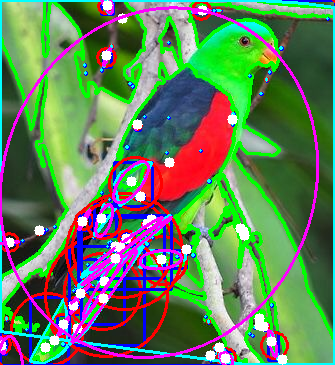

In [86]:
# Approximate contour to reduce points
for contour in contours:
    epsilon = 0.02 * cv2.arcLength(contour, True)
    approx = cv2.approxPolyDP(contour, epsilon, True)

    # Check if contour is convex
    is_convex = cv2.isContourConvex(approx)

    # Fit ellipse (if contour has at least 5 points)
    if len(contour) >= 5:
        ellipse = cv2.fitEllipse(contour)
        cv2.ellipse(img_contours, ellipse, (255, 0, 255), 2)

    # Moments for centroid
    M = cv2.moments(contour)
    if M["m00"] != 0:
        cX = int(M["m10"] / M["m00"])
        cY = int(M["m01"] / M["m00"])
        cv2.circle(img_contours, (cX, cY), 5, (255, 255, 255), -1)
cv2_imshow(img_contours)

## 9. Feature Detection

### Harris Corner Detection

In [87]:
# Harris corner detection
gray_float = np.float32(gray)
harris_corners = cv2.cornerHarris(gray_float, 2, 3, 0.04)

In [88]:
# Dilate for better visualization
harris_corners = cv2.dilate(harris_corners, None)

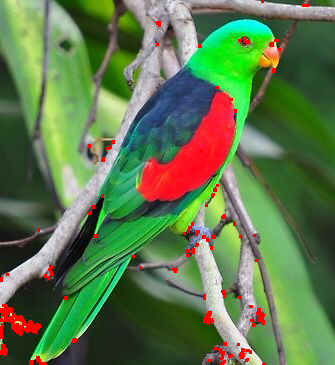

In [89]:
# Mark corners
img_harris = img.copy()
img_harris[harris_corners > 0.01 * harris_corners.max()] = [0, 0, 255]
cv2_imshow(img_harris)

### Shi-Tomasi Corner Detection

In [90]:
# Good features to track (Shi-Tomasi)
corners = cv2.goodFeaturesToTrack(gray, maxCorners=100, qualityLevel=0.01,
                                 minDistance=10, blockSize=3)

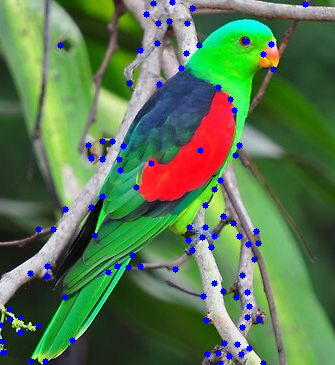

In [91]:
img_corners = img.copy()
if corners is not None:
    corners = corners.astype(int)
    for corner in corners:
        x, y = corner.ravel()
        cv2.circle(img_corners, (x, y), 3, (255, 0, 0), -1)
cv2_imshow(img_corners)

### SIFT Feature Detection

In [92]:
# Create SIFT detector
sift = cv2.SIFT_create()

In [93]:
# Detect keypoints and compute descriptors
keypoints, descriptors = sift.detectAndCompute(gray, None)

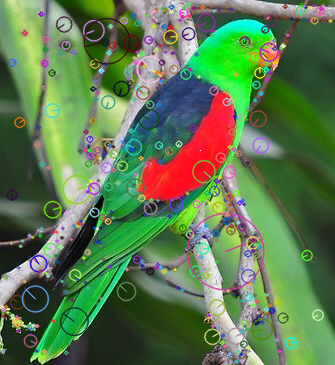

In [94]:
# Draw keypoints
img_sift = cv2.drawKeypoints(img, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2_imshow(img_sift)

In [ ]:
print(f"Number of SIFT keypoints: {len(keypoints)}")

Number of SIFT keypoints: 521


### ORB Feature Detection

In [95]:
# Create ORB detector
orb = cv2.ORB_create()

In [96]:
# Find keypoints and descriptors
kp_orb, des_orb = orb.detectAndCompute(gray, None)

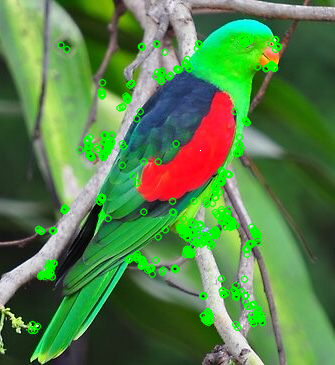

In [97]:
# Draw keypoints
img_orb = cv2.drawKeypoints(img, kp_orb, None, color=(0, 255, 0), flags=0)
cv2_imshow(img_orb)

## 10. Image Segmentation

### Watershed Algorithm

In [98]:
# Watershed segmentation
# Start with a binary image
_, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

In [99]:
# Remove noise
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)

In [100]:
# Find sure background
sure_bg = cv2.dilate(opening, kernel, iterations=3)

In [101]:
# Find sure foreground
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
_, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

In [102]:
# Find unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg, sure_fg)

In [103]:
# Marker labelling
_, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0

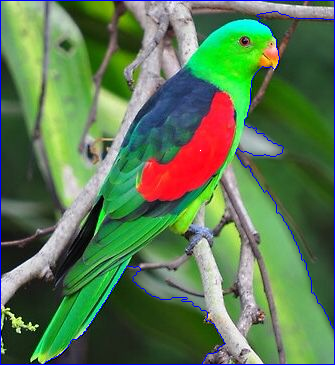

In [104]:
# Apply watershed
markers = cv2.watershed(img, markers)
img[markers == -1] = [255, 0, 0]  # Mark boundaries in red
cv2_imshow(img)

### K-means Clustering

In [105]:
def kmeans_segmentation(image, k=3):
    # Reshape image to be a list of pixels
    pixel_values = image.reshape((-1, 3))
    pixel_values = np.float32(pixel_values)

    # Define criteria and apply kmeans
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    _, labels, centers = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    # Convert back to uint8 and reshape to original image shape
    centers = np.uint8(centers)
    segmented_data = centers[labels.flatten()]
    segmented_image = segmented_data.reshape(image.shape)

    return segmented_image

In [106]:
# Apply K-means with different k values
kmeans_2 = kmeans_segmentation(img, k=2)
kmeans_4 = kmeans_segmentation(img, k=4)
kmeans_8 = kmeans_segmentation(img, k=8)

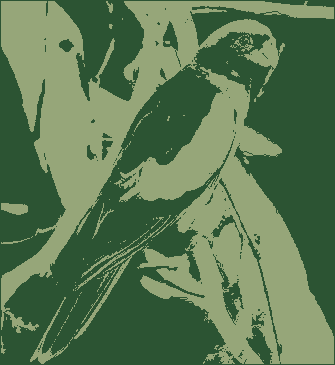

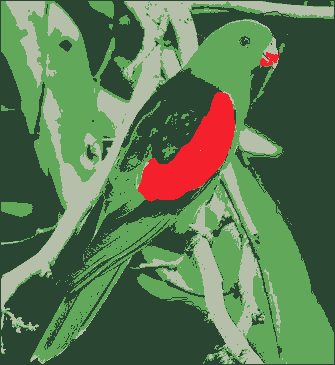

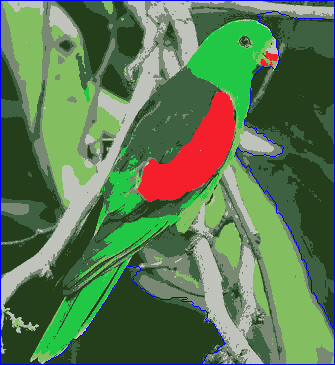

In [107]:
cv2_imshow(kmeans_2)
cv2_imshow(kmeans_4)
cv2_imshow(kmeans_8)

## Complete Example: Image Processing Pipeline

In [ ]:
def complete_image_processing_pipeline(image_path):
    # Load image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Could not load image: {image_path}")
        return None

    # Convert to RGB for matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Create figure for results
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    fig.suptitle('Complete Image Processing Pipeline', fontsize=16)

    # Original image
    axes[0, 0].imshow(img_rgb)
    axes[0, 0].set_title('Original')
    axes[0, 0].axis('off')

    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    axes[0, 1].imshow(gray, cmap='gray')
    axes[0, 1].set_title('Grayscale')
    axes[0, 1].axis('off')

    # Gaussian blur
    blurred = cv2.GaussianBlur(img_rgb, (15, 15), 0)
    axes[0, 2].imshow(blurred)
    axes[0, 2].set_title('Gaussian Blur')
    axes[0, 2].axis('off')

    # Edge detection
    edges = cv2.Canny(gray, 50, 150)
    axes[0, 3].imshow(edges, cmap='gray')
    axes[0, 3].set_title('Canny Edges')
    axes[0, 3].axis('off')

    # Thresholding
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    axes[1, 0].imshow(thresh, cmap='gray')
    axes[1, 0].set_title('Otsu Threshold')
    axes[1, 0].axis('off')

    # Morphological operations
    kernel = np.ones((5, 5), np.uint8)
    morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
    axes[1, 1].imshow(morph, cmap='gray')
    axes[1, 1].set_title('Morphological Closing')
    axes[1, 1].axis('off')

    # Contours
    contours, _ = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    img_contours = img_rgb.copy()
    cv2.drawContours(img_contours, contours, -1, (0, 255, 0), 2)
    axes[1, 2].imshow(img_contours)
    axes[1, 2].set_title('Contours')
    axes[1, 2].axis('off')

    # Harris corners
    gray_float = np.float32(gray)
    harris = cv2.cornerHarris(gray_float, 2, 3, 0.04)
    harris = cv2.dilate(harris, None)
    img_harris = img_rgb.copy()
    img_harris[harris > 0.01 * harris.max()] = [255, 0, 0]
    axes[1, 3].imshow(img_harris)
    axes[1, 3].set_title('Harris Corners')
    axes[1, 3].axis('off')

    # HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    hsv_rgb = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
    axes[2, 0].imshow(hsv_rgb)
    axes[2, 0].set_title('HSV Color Space')
    axes[2, 0].axis('off')

    # Histogram equalization
    gray_eq = cv2.equalizeHist(gray)
    axes[2, 1].imshow(gray_eq, cmap='gray')
    axes[2, 1].set_title('Histogram Equalization')
    axes[2, 1].axis('off')

    # K-means segmentation
    kmeans_result = kmeans_segmentation(img_rgb, k=4)
    axes[2, 2].imshow(kmeans_result)
    axes[2, 2].set_title('K-means (k=4)')
    axes[2, 2].axis('off')

    # Bilateral filter
    bilateral = cv2.bilateralFilter(img_rgb, 9, 75, 75)
    axes[2, 3].imshow(bilateral)
    axes[2, 3].set_title('Bilateral Filter')
    axes[2, 3].axis('off')

    plt.tight_layout()
    plt.show()

    return {
        'original': img_rgb,
        'gray': gray,
        'blurred': blurred,
        'edges': edges,
        'thresh': thresh,
        'contours': contours,
        'harris': img_harris,
        'kmeans': kmeans_result
    }

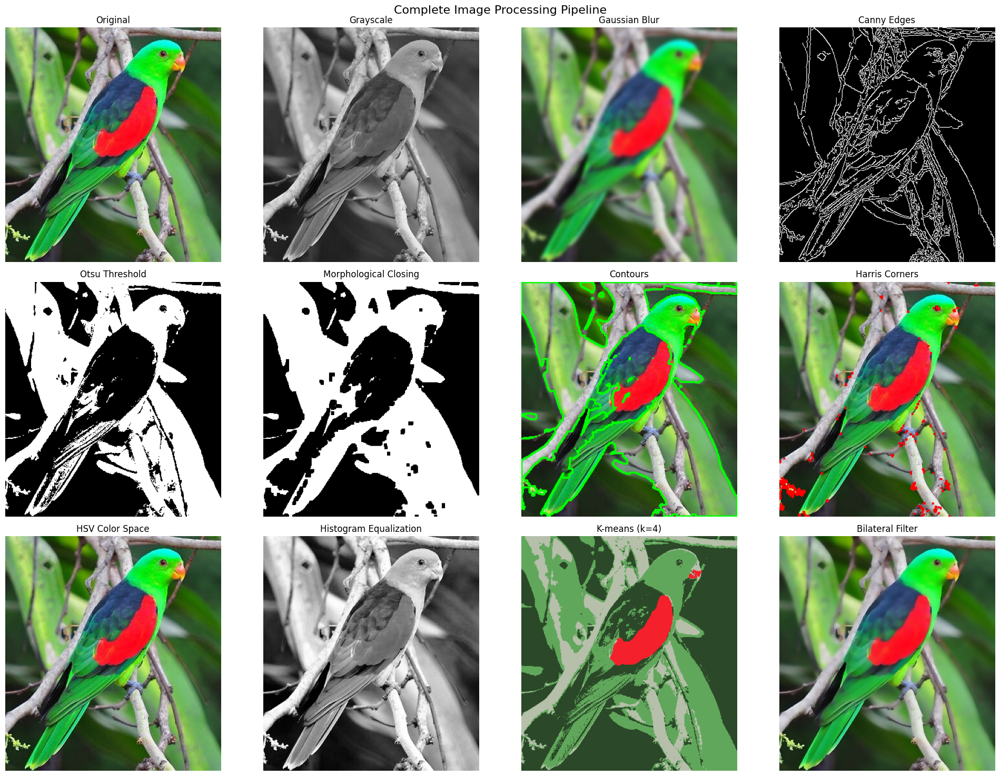

In [ ]:
# Usage
results = complete_image_processing_pipeline('Parrot.jpg')